# Machine Learning using Python-- PART II-UNSUPERVISED MACHINE LEARNING-CREDIT CARD 



In [3]:
import warnings

import os

import pandas as pd 

import numpy as np

import matplotlib.pyplot as plt
%matplotlib inline
from matplotlib import pyplot

import seaborn as sns


from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn import metrics
from sklearn import preprocessing
from sklearn.metrics import average_precision_score, confusion_matrix, accuracy_score, classification_report, plot_confusion_matrix


import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt 
from sklearn.preprocessing import StandardScaler
from IPython.display import display
from sklearn.cluster import KMeans 
from sklearn.decomposition import PCA
from mpl_toolkits.mplot3d import Axes3D
from sklearn.metrics import homogeneity_score, completeness_score, \
v_measure_score, adjusted_rand_score, adjusted_mutual_info_score, silhouette_score
%matplotlib inline


In [4]:
warnings.filterwarnings('ignore')

pd.options.display.max_columns = 50

pd.options.display.float_format = '{:.7f}'.format

pd.options.display.max_rows = None

### Check a few observations and get familiar with the data

In [5]:
df = pd.read_csv('credit_card.csv')
df.head(5)

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,40.9007490,0.8181820,95.4000000,0.0000000,95.4000000,0.0000000,0.1666670,0.0000000,0.0833330,0.0000000,0,2,1000.0000000,201.8020840,139.5097870,0.0000000,12
1,C10002,3202.4674160,0.9090910,0.0000000,0.0000000,0.0000000,6442.9454830,0.0000000,0.0000000,0.0000000,0.2500000,4,0,7000.0000000,4103.0325970,1072.3402170,0.2222220,12
2,C10003,2495.1488620,1.0000000,773.1700000,773.1700000,0.0000000,0.0000000,1.0000000,1.0000000,0.0000000,0.0000000,0,12,7500.0000000,622.0667420,627.2847870,0.0000000,12
3,C10004,1666.6705420,0.6363640,1499.0000000,1499.0000000,0.0000000,205.7880170,0.0833330,0.0833330,0.0000000,0.0833330,1,1,7500.0000000,0.0000000,nan,0.0000000,12
4,C10005,817.7143350,1.0000000,16.0000000,16.0000000,0.0000000,0.0000000,0.0833330,0.0833330,0.0000000,0.0000000,0,1,1200.0000000,678.3347630,244.7912370,0.0000000,12


# Q1. What does the primary analysis of several categoricalfeatures reveal?



* There are 8950 registers with 18 features.
* The data is in numerical form, except for the customer id (CUST_ID) which is an object containing letters and numbers.
* There are no null values in the dataset.
* On average, clients maintain 1564 dollars in the bank account for use with the debit card.
* On average, clients spend 1000 USD on purchases. 
* About the purchase mode, on average clients spend 592 dollars on one-off purchases and 411 dollars on purchases with installments. 
* Good news for the bank: clients, on average, use 978 dollars as cash advancement. One must have in mind that, in general, the taxes for cash advancement are higher than the credit card taxes. 
* In regards to frequency, clients more frequently make purchases with installents (mean = 0.364) than one-off (mean = 0.202). 
* Regarding credit limits on the credit card, the maximum limit is 30,000 dollars with the minimum being 50 dollars. On average, clients have a credit card limit of 4494 dollars.



### Check the size and info of the data set.

In [6]:
df.shape

(8950, 18)

- 8950 rows and 18 columns

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8950 entries, 0 to 8949
Data columns (total 18 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   CUST_ID                           8950 non-null   object 
 1   BALANCE                           8950 non-null   float64
 2   BALANCE_FREQUENCY                 8950 non-null   float64
 3   PURCHASES                         8950 non-null   float64
 4   ONEOFF_PURCHASES                  8950 non-null   float64
 5   INSTALLMENTS_PURCHASES            8950 non-null   float64
 6   CASH_ADVANCE                      8950 non-null   float64
 7   PURCHASES_FREQUENCY               8950 non-null   float64
 8   ONEOFF_PURCHASES_FREQUENCY        8950 non-null   float64
 9   PURCHASES_INSTALLMENTS_FREQUENCY  8950 non-null   float64
 10  CASH_ADVANCE_FREQUENCY            8950 non-null   float64
 11  CASH_ADVANCE_TRX                  8950 non-null   int64  
 12  PURCHA

# Q2. Perform the following Exploratory Data Analysis tasks:


# Q2.a.Check for missing values. Impute the missing values if there is any.

In [8]:
df.isnull().sum()

CUST_ID                               0
BALANCE                               0
BALANCE_FREQUENCY                     0
PURCHASES                             0
ONEOFF_PURCHASES                      0
INSTALLMENTS_PURCHASES                0
CASH_ADVANCE                          0
PURCHASES_FREQUENCY                   0
ONEOFF_PURCHASES_FREQUENCY            0
PURCHASES_INSTALLMENTS_FREQUENCY      0
CASH_ADVANCE_FREQUENCY                0
CASH_ADVANCE_TRX                      0
PURCHASES_TRX                         0
CREDIT_LIMIT                          1
PAYMENTS                              0
MINIMUM_PAYMENTS                    313
PRC_FULL_PAYMENT                      0
TENURE                                0
dtype: int64

'MINIMUM_PAYMENTS' and 'CREDIT_LIMIT' have null values

In [9]:
#imputing null values

df['CREDIT_LIMIT'].fillna((df['CREDIT_LIMIT'].median()), inplace=True)
df['MINIMUM_PAYMENTS'].fillna((df['MINIMUM_PAYMENTS'].median()), inplace=True)

### Drop unnecessary columns

In [10]:
df = df.drop('CUST_ID', axis=1)

# Q2.B.REMOVING OUTLIERS

In [29]:
def remove_outliers(df,col,k=2):
    mean = df[col].mean()
    global df1
    sd = df[col].std()
    final_list = [x for x in df[col] if (x>mean - k*sd)]
    final_list = [x for x in final_list if (x<mean + k*sd)]
    df1 = df.loc[df[col].isin(final_list)] ; 
    print(df1.shape);
    return df1
    

remove_outliers(df,'BALANCE',k = 2)

(8459, 18)


,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE,Cluster
0,40.9007490,0.8181820,95.4000000,0.0000000,95.4000000,0.0000000,0.1666670,0.0000000,0.0833330,0.0000000,0,2,1000.0000000,201.8020840,139.5097870,0.0000000,12,1
1,3202.4674160,0.9090910,0.0000000,0.0000000,0.0000000,6442.9454830,0.0000000,0.0000000,0.0000000,0.2500000,4,0,7000.0000000,4103.0325970,1072.3402170,0.2222220,12,2
2,2495.1488620,1.0000000,773.1700000,773.1700000,0.0000000,0.0000000,1.0000000,1.0000000,0.0000000,0.0000000,0,12,7500.0000000,622.0667420,627.2847870,0.0000000,12,2
3,1666.6705420,0.6363640,1499.0000000,1499.0000000,0.0000000,205.7880170,0.0833330,0.0833330,0.0000000,0.0833330,1,1,7500.0000000,0.0000000,312.3439470,0.0000000,12,2
4,817.7143350,1.0000000,16.0000000,16.0000000,0.0000000,0.0000000,0.0833330,0.0833330,0.0000000,0.0000000,0,1,1200.0000000,678.3347630,244.7912370,0.0000000,12,1
5,1809.8287510,1.0000000,1333.2800000,0.0000000,1333.2800000,0.0000000,0.6666670,0.0000000,0.5833330,0.0000000,0,8,1800.0000000,1400.0577700,2407.2460350,0.0000000,12,1
6,627.2608060,1.0000000,7091.0100000,6402.6300000,688.3800000,0.0000000,1.0000000,1.0000000,1.0000000,0.0000000,0,64,13500.0000000,6354.3143280,198.0658940,1.0000000,12,2
7,1823.6527430,1.0000000,436.2000000,0.0000000,436.2000000,0.0000000,1.0000000,0.0000000,1.0000000,0.0000000,0,12,2300.0000000,679.0650820,532.0339900,0.0000000,12,1
8,1014.9264730,1.0000000,861.4900000,661.4900000,200.0000000,0.0000000,0.3333330,0.0833330,0.2500000,0.0000000,0,5,7000.0000000,688.2785680,311.9634090,0.0000000,12,1
9,152.2259750,0.5454550,1281.6000000,1281.6000000,0.0000000,0.0000000,0.1666670,0.1666670,0.0000000,0.0000000,0,3,11000.0000000,1164.7705910,100.3022620,0.0000000,12,2


# Q2.C.Check correlation among features 

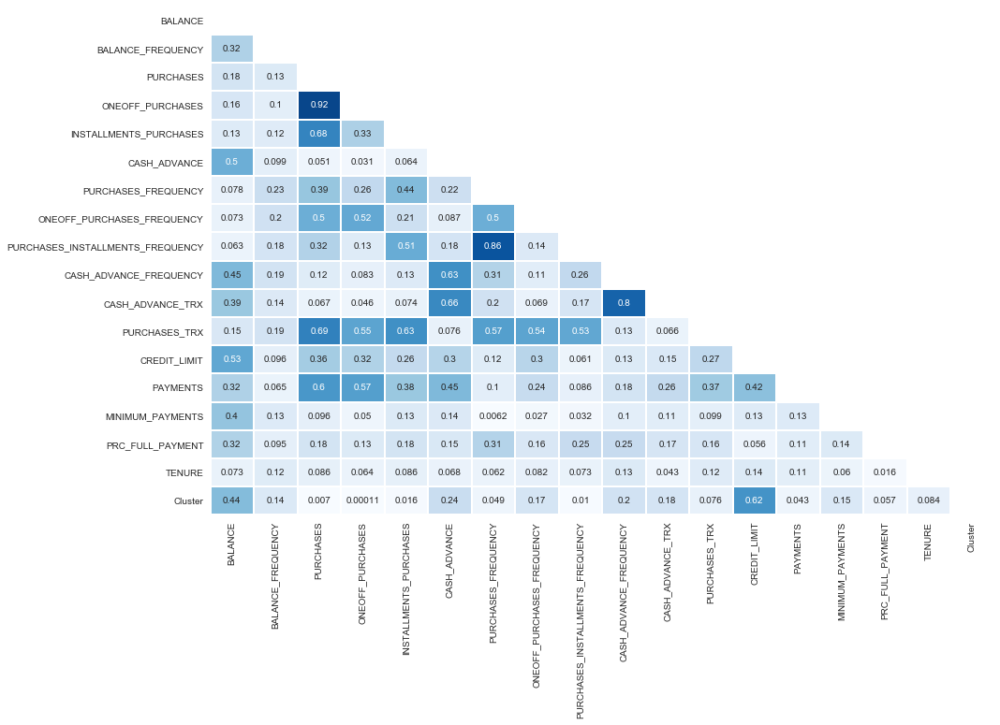

In [30]:
#Function to plot correlation matrix

def correlation_plot(df):
    
    corr = abs(df.corr()) # correlation matrix
    lower_triangle = np.tril(corr, k = -1)  
    mask = lower_triangle == 0 

    plt.figure(figsize = (15,10)) 
    sns.set_style(style = 'white')  
    sns.heatmap(lower_triangle, center=0.5, cmap= 'Blues', xticklabels = corr.index,
                yticklabels = corr.columns,cbar = False, annot= True, linewidths= 1, mask = mask)   # Da Heatmap
    plt.show()
    
correlation_plot(df)

### Check distribution of features and comment your findings

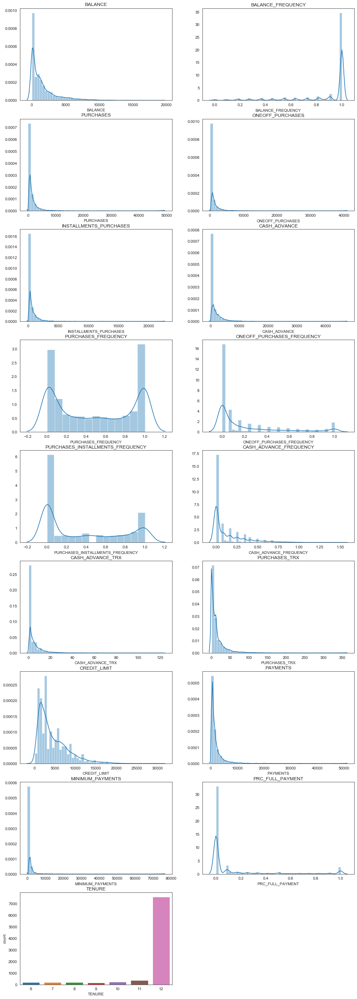

In [12]:
#univariate analysis

position = 1
plt.figure(figsize=(15,45))

for column in ['BALANCE', 'BALANCE_FREQUENCY', 'PURCHASES', 'ONEOFF_PURCHASES',
       'INSTALLMENTS_PURCHASES', 'CASH_ADVANCE', 'PURCHASES_FREQUENCY',
       'ONEOFF_PURCHASES_FREQUENCY', 'PURCHASES_INSTALLMENTS_FREQUENCY',
       'CASH_ADVANCE_FREQUENCY', 'CASH_ADVANCE_TRX', 'PURCHASES_TRX',
       'CREDIT_LIMIT', 'PAYMENTS', 'MINIMUM_PAYMENTS', 'PRC_FULL_PAYMENT',
       'TENURE']:    
    plt.subplot(9,2,position)
    if column in ['TENURE']:
        sns.countplot(df[column])
    else:
        sns.distplot(df[column])
    plt.title(column)        
    position += 1
plt.show() 

### Standardize the data using appropriate methods

In [13]:
#normalize the dataset
scaler = StandardScaler()
data = scaler.fit_transform(df) # scaling the data

### Build a k-means algorithm for clustering credit card data

### Build k means model on various k values and plot the inertia against various k values

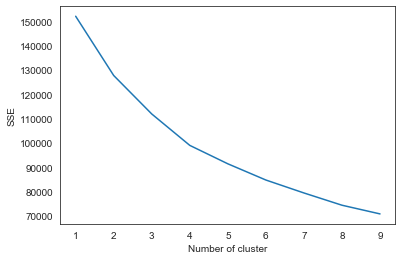

In [14]:
sse = {}
for k in range(1, 10):
    kmeans = KMeans(n_clusters=k, max_iter=1000).fit(data)
    sse[k] = kmeans.inertia_ # Inertia: Sum of distances of samples to their closest cluster center
plt.figure()
plt.plot(list(sse.keys()), list(sse.values()))
plt.xlabel("Number of cluster")
plt.ylabel("SSE")
plt.show()

# Q5. Find the optimum value of k for k-means clustering using the silhouette score method and specify the number of observations in each cluster using a bar plot

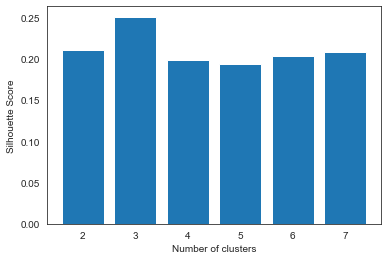

In [15]:
silhouette_scores = [] 

for n_cluster in range(2, 8):
    silhouette_scores.append( 
        silhouette_score(data, KMeans(n_clusters = n_cluster).fit_predict(data))) 
    
# Plotting a bar graph to compare the results 
k = [2, 3, 4, 5, 6,7] 
plt.bar(k, silhouette_scores) 
plt.xlabel('Number of clusters', fontsize = 10) 
plt.ylabel('Silhouette Score', fontsize = 10) 
plt.show() 

# Q4. Find the optimum value of k for k-means clustering using the elbow method. Plot the elbow curve

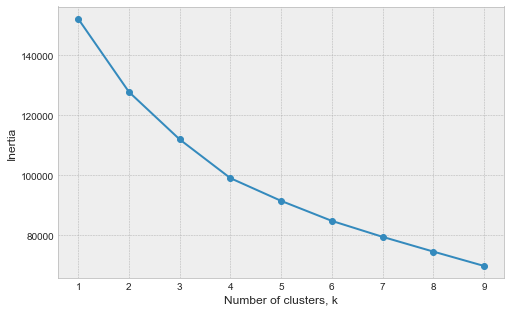

In [16]:
ks = range(1, 10)
inertias = [] # initializing an empty array

for k in ks:
    model = KMeans(n_clusters=k)
    model.fit(data)
    inertias.append(model.inertia_)

plt.figure(figsize=(8,5))
plt.style.use('bmh')
plt.plot(ks, inertias, '-o')
plt.xlabel('Number of clusters, k')
plt.ylabel('Inertia')
plt.xticks(ks)
plt.show()

### Which k value gives the best result?

- k = 3 gives the highest silhouette score and also comparable inertia value

# Q3. Perform dimensionality reduction using PCA such that the 95% of the variance is explained



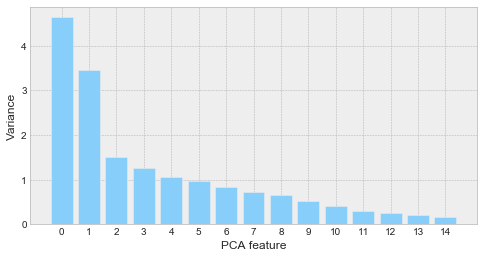

In [17]:
#variance explained with the number of features
pca = PCA(random_state=123)
pca.fit(data)
features = range(pca.n_components_)

plt.figure(figsize=(8,4))
plt.bar(features[:15], pca.explained_variance_[:15], color='lightskyblue')
plt.xlabel('PCA feature')
plt.ylabel('Variance')
plt.xticks(features[:15])
plt.show()

In [18]:
# Applying PCA

from sklearn.decomposition import PCA

# Reducing the dimensions of the data 
pca = PCA(n_components = 2) 
x_principal = pca.fit_transform(df) 
x_principal = pd.DataFrame(x_principal) 
x_principal.columns = ['P1', 'P2'] 
  
x_principal.head()

,P1,P2
0,-4324.0025882,915.7653688
1,4121.3375984,-2437.9240947
2,1499.2924816,-2001.7571454
3,1321.8316427,-1387.7200461
4,-3740.7247273,751.7336878


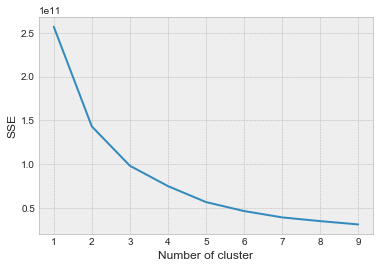

In [19]:
sse = {}
for k in range(1, 10):
    kmeans = KMeans(n_clusters=k, max_iter=1000).fit(x_principal)
    sse[k] = kmeans.inertia_ # Inertia: Sum of distances of samples to their closest cluster center
plt.figure()
plt.plot(list(sse.keys()), list(sse.values()))
plt.xlabel("Number of cluster")
plt.ylabel("SSE")
plt.show()

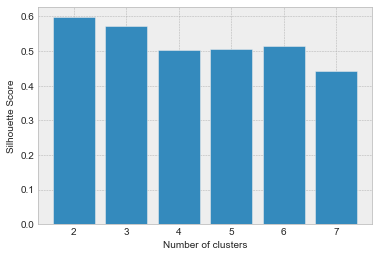

In [20]:
silhouette_scores = [] 

for n_cluster in range(2, 8):
    silhouette_scores.append( 
        silhouette_score(x_principal, KMeans(n_clusters = n_cluster).fit_predict(x_principal))) 
    
# Plotting a bar graph to compare the results 
k = [2, 3, 4, 5, 6,7] 
plt.bar(k, silhouette_scores) 
plt.xlabel('Number of clusters', fontsize = 10) 
plt.ylabel('Silhouette Score', fontsize = 10) 
plt.show()

# Q.6 Build a K-means clustering model using the optimum value of K.

### Create a new column as a cluster label in the original data frame and perform cluster analysis. Check the correlation of cluster labels with various features and mention your inferences

In [21]:
kmeans = KMeans(n_clusters = 3, init = 'k-means++', random_state = 42)
y_kmeans = kmeans.fit_predict(df)
df['Cluster'] = y_kmeans

In [22]:
df.head()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE,Cluster
0,40.9007490,0.8181820,95.4000000,0.0000000,95.4000000,0.0000000,0.1666670,0.0000000,0.0833330,0.0000000,0,2,1000.0000000,201.8020840,139.5097870,0.0000000,12,1
1,3202.4674160,0.9090910,0.0000000,0.0000000,0.0000000,6442.9454830,0.0000000,0.0000000,0.0000000,0.2500000,4,0,7000.0000000,4103.0325970,1072.3402170,0.2222220,12,2
2,2495.1488620,1.0000000,773.1700000,773.1700000,0.0000000,0.0000000,1.0000000,1.0000000,0.0000000,0.0000000,0,12,7500.0000000,622.0667420,627.2847870,0.0000000,12,2
3,1666.6705420,0.6363640,1499.0000000,1499.0000000,0.0000000,205.7880170,0.0833330,0.0833330,0.0000000,0.0833330,1,1,7500.0000000,0.0000000,312.3439470,0.0000000,12,2
4,817.7143350,1.0000000,16.0000000,16.0000000,0.0000000,0.0000000,0.0833330,0.0833330,0.0000000,0.0000000,0,1,1200.0000000,678.3347630,244.7912370,0.0000000,12,1


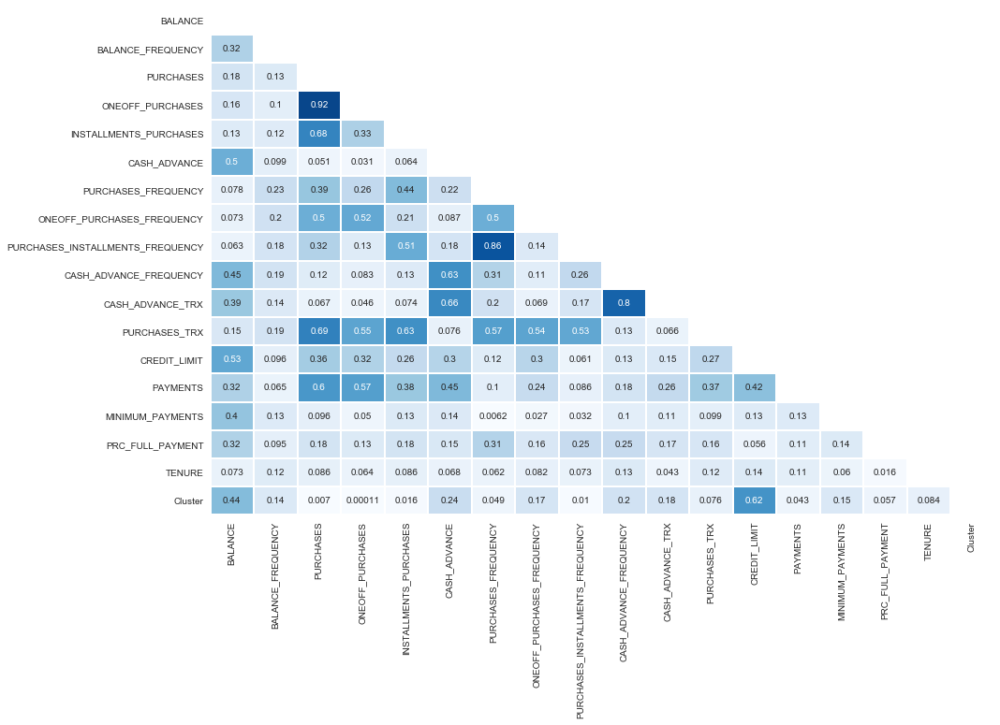

In [23]:
#Function to plot correlation matrix

def correlation_plot(df):
    
    corr = abs(df.corr()) # correlation matrix
    lower_triangle = np.tril(corr, k = -1)  # select only the lower triangle of the correlation matrix
    mask = lower_triangle == 0  # to mask the upper triangle in the following heatmap

    plt.figure(figsize = (15,10))  # setting the figure size
    sns.set_style(style = 'white')  # Setting it to white so that we do not see the grid lines
    sns.heatmap(lower_triangle, center=0.5, cmap= 'Blues', xticklabels = corr.index,
                yticklabels = corr.columns,cbar = False, annot= True, linewidths= 1, mask = mask)   # Da Heatmap
    plt.show()
    
correlation_plot(df)

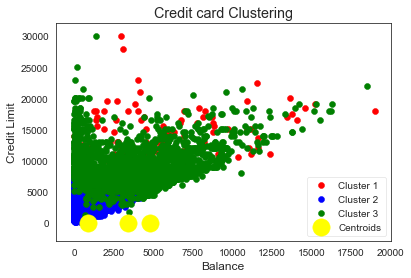

In [24]:
#Cluster Analysis

df1 = df.values
plt.scatter(df1[y_kmeans == 0][:,0], df1[y_kmeans == 0][:,12], c = 'red', label = 'Cluster 1')
plt.scatter(df1[y_kmeans == 1][:,0], df1[y_kmeans == 1][:,12], c = 'blue', label = 'Cluster 2')
plt.scatter(df1[y_kmeans == 2][:,0], df1[y_kmeans == 2][:,12], c = 'green', label = 'Cluster 3')

plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], s = 300, c = 'yellow', label = 'Centroids')
plt.title('Credit card Clustering')
plt.xlabel('Balance')
plt.ylabel('Credit Limit')
plt.legend()
plt.show()

<Figure size 864x864 with 0 Axes>

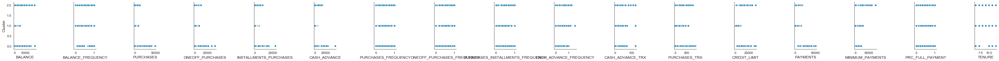

In [25]:
plt.figure(figsize=(12,12))

pp = sns.pairplot(data=df,
                  y_vars=['Cluster'],
                  x_vars=['BALANCE', 'BALANCE_FREQUENCY', 'PURCHASES', 'ONEOFF_PURCHASES',
       'INSTALLMENTS_PURCHASES', 'CASH_ADVANCE', 'PURCHASES_FREQUENCY',
       'ONEOFF_PURCHASES_FREQUENCY', 'PURCHASES_INSTALLMENTS_FREQUENCY',
       'CASH_ADVANCE_FREQUENCY', 'CASH_ADVANCE_TRX', 'PURCHASES_TRX',
       'CREDIT_LIMIT', 'PAYMENTS', 'MINIMUM_PAYMENTS', 'PRC_FULL_PAYMENT',
       'TENURE'])
plt.show()



We can see that our Inertia and silhoutte scores drastically improve after doing Principal Component Analysis with n_component = 2 along with K means algorithm